In [1]:
!pip install catboost

Defaulting to user installation because normal site-packages is not writeable
  Using cached catboost-1.2-cp38-cp38-manylinux2014_x86_64.whl (98.6 MB)
  Using cached graphviz-0.20.1-py3-none-any.whl (47 kB)


In [2]:
!pip install mlflow

Defaulting to user installation because normal site-packages is not writeable
  Using cached mlflow-2.4.2-py3-none-any.whl (18.1 MB)
  Using cached databricks_cli-0.17.7-py3-none-any.whl
  Using cached entrypoints-0.4-py3-none-any.whl (5.3 kB)
  Using cached GitPython-3.1.32-py3-none-any.whl (188 kB)
  Using cached alembic-1.11.1-py3-none-any.whl (224 kB)
  Using cached docker-6.1.3-py3-none-any.whl (148 kB)
  Using cached Flask-2.3.2-py3-none-any.whl (96 kB)
  Using cached querystring_parser-1.2.4-py2.py3-none-any.whl (7.9 kB)
  Using cached gunicorn-20.1.0-py3-none-any.whl (79 kB)
  Using cached Mako-1.2.4-py3-none-any.whl (78 kB)
  Using cached PyJWT-2.7.0-py3-none-any.whl (22 kB)
  Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
  Using cached urllib3-1.26.16-py2.py3-none-any.whl (143 kB)
  Using cached Werkzeug-2.3.6-py3-none-any.whl (242 kB)
  Using cached itsdangerous-2.1.2-py3-none-any.whl (15 kB)
  Using cached blinker-1.6.2-py3-none-any.whl (13 kB)
  Using cached gitdb-4

In [3]:
!pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable
  Using cached lightgbm-3.3.5-py3-none-manylinux1_x86_64.whl (2.0 MB)


In [4]:
!pip install bayesian-optimization

Defaulting to user installation because normal site-packages is not writeable
  Using cached bayesian_optimization-1.4.3-py3-none-any.whl (18 kB)
  Using cached colorama-0.4.6-py2.py3-none-any.whl (25 kB)


In [136]:
import pandas as pd
import numpy as np

from time import time
from datetime import datetime

import mlflow

import os, sys
import gc
module_path = os.path.abspath(os.path.join(".."))
if module_path not in sys.path:
    sys.path.append(module_path)

import math
from time import time
import json

import joblib
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, make_scorer, f1_score, fbeta_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import HistGradientBoostingClassifier

import lightgbm as lgb
import xgboost as xgb
import catboost as catboost

from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score, accuracy_score

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.metrics import roc_curve, auc, f1_score

import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

import shap

mlflow.autolog(True)
mlflow.set_experiment(datetime.today().strftime('%Y-%m-%d %H:%M:%S'))


2023/07/12 18:02:25 INFO mlflow.tracking.fluent: Autologging successfully enabled for lightgbm.
2023/07/12 18:02:25 WARNING mlflow.utils.autologging_utils: You are using an unsupported version of sklearn. If you encounter errors during autologging, try upgrading / downgrading sklearn to a supported version, or try upgrading MLflow.
2023/07/12 18:02:25 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2023/07/12 18:02:25 INFO mlflow.tracking.fluent: Experiment with name '2023-07-12 18:02:25' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///home/jupyter/notebooks/modeling/mlruns/725733082712343083', creation_time=1689184945994, experiment_id='725733082712343083', last_update_time=1689184945994, lifecycle_stage='active', name='2023-07-12 18:02:25', tags={}>

In [134]:
# from https://www.kaggle.com/code/neerajmohan/randomforest-model-with-bayesian-optimization

def stratified_kfold_score(clf,X,y,n_fold):
    strat_kfold = StratifiedKFold(n_splits=n_fold, shuffle=True, random_state=1)
    roc_list = []

    for train_index, test_index in strat_kfold.split(X, y):
        x_train_fold, x_test_fold = X[train_index], X[test_index]
        y_train_fold, y_test_fold = y[train_index], y[test_index]
        clf.fit(x_train_fold, y_train_fold)
        preds = clf.predict(x_test_fold)
        roc_test = roc_auc_score(preds,y_test_fold)
        roc_list.append(roc_test)

    return np.array(roc_list).mean()

In [141]:
# from https://www.kaggle.com/code/sz8416/simple-bayesian-optimization-for-lightgbm

def bayes_parameter_opt(X, y, init_round=15, opt_round=25, n_folds=5, random_seed=6, 
                        learning_rate=0.05, output_process=False, subsample=0.75, 
                        model=None, feature_names=None):
                                
    scale_pos_weight = (np.size(y) - np.count_nonzero(y)) / np.count_nonzero(y)
    def lgb_eval(
        num_leaves, feature_fraction, bagging_fraction, max_depth, min_split_gain, min_child_weight,
        reg_alpha, reg_lambda
    ):
        # prepare data
        train_data = lgb.Dataset(data=X.to_numpy(), label=y, free_raw_data=False)
        
        params = {
            'application':'binary',
            'n_estimators': 3000, 
            'learning_rate':learning_rate, 
            'early_stopping_round':100, 
            'metric':'auc',
            'subsample': subsample,
            'scale_pos_weight': scale_pos_weight,
            'random_seed':random_seed,
        }
        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['min_split_gain'] = min_split_gain
        params['min_child_weight'] = min_child_weight
        params["reg_alpha"] = reg_alpha
        params["reg_lambda"] = reg_lambda
        #mlflow.log_params(params)

        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, verbose_eval =False, metrics=['auc'])
        return max(cv_result['auc-mean'])

    def xgb_eval(
         max_leaves, max_depth, min_child_weight, reg_alpha, reg_lambda
    ):
        # prepare data
        train_data = xgb.DMatrix(X.to_numpy(), label=y)
        
        params = {
            'objective': 'binary:logistic',
            'n_estimators': 100,
            'learning_rate': learning_rate,
            'eval_metric':'auc',
            'subsample': subsample,
            'scale_pos_weight': scale_pos_weight,
            'random_seed':random_seed,
        }
        params["max_leaves"] = int(max_leaves)
        params["max_depth"] = int(max_depth)
        params["min_child_weight"] = min_child_weight
        params["reg_alpha"] = 0
        params["reg_lambda"] = 0
        #mlflow.log_params(params)

        cv_result = xgb.cv(params, train_data, num_boost_round=opt_round, early_stopping_rounds=100, nfold=n_folds, seed=random_seed, metrics=['auc'])
        return max(cv_result['test-auc-mean'])
                     
    def catboost_eval(
         max_leaves, max_depth, l2_leaf_reg, bagging_temperature, model_shrink_rate
    ):
        # prepare data
        train_data = catboost.Pool(X.to_numpy(), label=y, feature_names=list(feature_names))
        
        params = {
            'nan_mode': 'Min',
            'scale_pos_weight': scale_pos_weight,
            'loss_function': 'Logloss',
            'eval_metric':'AUC',
            'n_estimators': 100,
            'random_seed': random_seed,
            'boosting_type': 'Plain',
            'grow_policy': 'Lossguide',

        }
        params["max_leaves"] = int(max_leaves)
        params["max_depth"] = int(max_depth)
        params["l2_leaf_reg"] = l2_leaf_reg
        params["model_shrink_rate"] = model_shrink_rate
        params["bagging_temperature"] = bagging_temperature
        #mlflow.log_params(params)

        cv_result = catboost.cv(pool=train_data, params=params, num_boost_round=opt_round, early_stopping_rounds=100, nfold=n_folds, seed=random_seed)
        #print(cv_result)
        return max(cv_result['test-AUC-mean'])

    def histgradientboost_eval(
         l2_regularization, max_leaf_nodes
    ):
        params = {
            'class_weight': 'balanced',
            'random_state': random_seed,
        }
        params["l2_regularization"] = l2_regularization
        params["max_leaf_nodes"] = int(max_leaf_nodes)

        clf = HistGradientBoostingClassifier(**params)
        score = stratified_kfold_score(clf,X.to_numpy(), y, n_folds)
        return score

                                
    assert model in ["xgb", "lgb", "catboost", "histgradientboost"], """model parameter must be one of "xgb", "lgb", "histgradientboost" or "catboost" """

    if model=="lgb":
        f_eval = lgb_eval
        params_eval = {
            'num_leaves': (20, 50),
            'feature_fraction': (0.1, 0.9),
            'bagging_fraction': (0.5, 1),
            'max_depth': (5, 20),
            'min_split_gain': (0.001, 0.1),
            'min_child_weight': (5, 50),
            'reg_alpha': (1e-6, 0.999),
            'reg_lambda': (1e-6, 1e2),

        }
    elif model=="xgb":
        f_eval = xgb_eval
        params_eval = {
            'max_leaves': (20, 60),
            'max_depth': (5, 50),
            'min_child_weight': (100, 200),
            'reg_alpha': (1e-20, 0.99999999999),
            'reg_lambda': (1e-20, 1e-19),
        }
    elif model=="catboost":
        f_eval = catboost_eval
        params_eval = {
            'max_leaves': (20, 60),
            'max_depth': (2, 16),
            'l2_leaf_reg': (1e-6, 1e2),
            'model_shrink_rate': (0.1, 30),
            'bagging_temperature': (0.1, 100),
        }
    elif model=="histgradientboost":
        f_eval = histgradientboost_eval
        params_eval = {
            'l2_regularization': (0, 1e4),
            'max_leaf_nodes': (2, 300),
        }

    # range 
    BO = BayesianOptimization(
        f_eval, 
        params_eval, 
        random_state=random_seed
    )
    
    try:
        mlflow.end_run()
    except Exception(e):
        pass
        
    with mlflow.start_run(run_name=f"""{datetime.today().strftime('%Y-%m-%d %H:%M:%S')} - Bayesian Optimisation {model} with {X.shape[0]} rows""") as run:
        # optimize
        BO.maximize(init_points=init_round, n_iter=opt_round)
        mlflow.set_tag("model", model)
        mlflow.set_tag("nb rows", X.shape[0])
        mlflow.set_tag("params_eval", json.dumps(params_eval))
            
    # return best parameters
    #return lgbBO.res['max']['max_params']
    return BO.max['params']



In [3]:
def custom_score(y_true, y_pred, c_fn=-10, c_fp=-1, c_tn=4, c_tp=0):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    s = tn * c_tn + fp * c_fp + fn * c_fn + tp * c_tp
    # in the current case, the best would have been best_fp=0 and best_fn=0, therefore best_tp = tp+fp and best_tn = tn+fn
    best_fp=0 
    best_fn=0
    best_tp = tp+fp
    best_tn = tn+fn
    best_s = best_tn * c_tn + best_fp * c_fp + best_fn * c_fn + best_tp * c_tp

    # worst case 
    worst_tp = 0
    worst_tn = 0
    worst_fn = tn+fn
    worst_fp = tp+fp
    worst_s = worst_tn * c_tn + worst_fp * c_fp + worst_fn * c_fn + worst_fp * c_tp

    #return "custom_score", (s - worst_s)/(best_s - worst_s), True    
    return (s - worst_s)/(best_s - worst_s)

In [146]:
def learn_model_cv(frac, model, force_param_opt=False, nb_splits=10, random_seed=6, X_train=None, y_train=None):
    assert frac in [0.1, 0.25, 1], "frac must be one of 0.1, 0.25, 1"
    assert model in ["xgb", "lgb", "catboost", "histgradientboost"], """model parameter must be one of "xgb", "lgb", "histgradientboost" or "catboost" """

    if X_train is None:
        X_train = pd.read_parquet(f"../working/train_test_data/{frac}/X_train.parquet")
        
    if y_train is None:
        y_train = np.load(f"../working/train_test_data/{frac}/y_train.npy")
        
    scale_pos_weight = (np.size(y_train) - np.count_nonzero(y_train)) / np.count_nonzero(y_train)

    print(f"Nb of training points: {X_train.shape[0]}")
    
    if not os.path.isdir("../working/models"):
        os.mkdir("../working/models")
        
    if not os.path.isdir(f"../working/models/{frac}"):
        os.mkdir(f"../working/models/{frac}")
        
    if not os.path.isdir(f"../working/models/{frac}/{model}"):
        os.mkdir(f"../working/models/{frac}/{model}")

    if force_param_opt or not os.path.exists(f"../working/models/{frac}/{model}/bayes_best_params.json"):

        opt_params = bayes_parameter_opt(X_train, y_train, model=model, init_round=5, opt_round=10, n_folds=5, random_seed=random_seed, learning_rate=0.05, feature_names=X_train.columns)
            
        if "max_depth" in opt_params:
            opt_params["max_depth"] = int(math.floor(opt_params["max_depth"]))
        if "num_leaves" in opt_params:
            opt_params["num_leaves"] = int(math.ceil(opt_params["num_leaves"]))
        if "max_leaves" in opt_params:
            opt_params["max_leaves"] = int(math.ceil(opt_params["max_leaves"]))
        if "n_estimators" in opt_params:
            opt_params["n_estimators"] = int(math.ceil(opt_params["n_estimators"]))
        if "max_leaf_nodes" in opt_params:
            opt_params["max_leaf_nodes"] = int(math.ceil(opt_params["max_leaf_nodes"]))
        with open(f"../working/models/{frac}/{model}/bayes_best_params.json", "w") as outfile:
            outfile.write(json.dumps(opt_params, indent=4))
    else:
        with open(f"../working/models/{frac}/{model}/bayes_best_params.json") as jfile:
            opt_params = json.load(jfile)

    if "max_depth" in opt_params:
        opt_params["max_depth"] = int(math.floor(opt_params["max_depth"]))
    if "num_leaves" in opt_params:
        opt_params["num_leaves"] = int(math.ceil(opt_params["num_leaves"]))
    if "max_leaves" in opt_params:
        opt_params["max_leaves"] = int(math.ceil(opt_params["max_leaves"]))
    if "n_estimators" in opt_params:
        opt_params["n_estimators"] = int(math.ceil(opt_params["n_estimators"]))
    if "max_leaf_nodes" in opt_params:
        opt_params["max_leaf_nodes"] = int(math.ceil(opt_params["max_leaf_nodes"]))

    scoring = {"AUC": "roc_auc", "custom_score": make_scorer(custom_score)}

    if model=="lgb":
        clf = lgb.LGBMClassifier(
            application='binary',
            learning_rate=0.05, 
            metric='auc',
            subsample= 0.75,
            n_estimators=3000,
            scale_pos_weight=scale_pos_weight,
            verbose=-1, 
            random_seed=random_seed,
            **opt_params
        )
    elif model=="xgb":
        clf = xgb.XGBClassifier(
            objective='binary:logistic',
            n_estimators=100,
            learning_rate=0.05,
            eval_metric='auc',
            subsample=0.75,
            scale_pos_weight=scale_pos_weight,
            random_seed=random_seed,
            **opt_params
        )
    elif model=="catboost":
        clf = catboost.CatBoostClassifier(
            nan_mode= 'Min',
            scale_pos_weight=scale_pos_weight,
            loss_function='Logloss',
            eval_metric='AUC',
            n_estimators=100,
            random_seed=random_seed,
            boosting_type='Plain',
            grow_policy='Lossguide',
            **opt_params
        )
    elif model=="histgradientboost":
        clf = HistGradientBoostingClassifier(
            class_weight='balanced',
            random_state=random_seed,
            **opt_params
        )

    
    t0 = time()
    cv_params = {}
    for k in opt_params:
        cv_params[k] = [ opt_params[k] ]

    try:
        mlflow.end_run()
    except Exception(e):
        pass
        
    with mlflow.start_run(run_name=f"""{datetime.today().strftime('%Y-%m-%d %H:%M:%S')} - GridSearchCV {model} with {X_train.shape[0]} rows""") as run:
        mlflow.set_tag("model", model)
        mlflow.set_tag("nb rows", X_train.shape[0])
        mlflow.log_params(cv_params)
        gs = GridSearchCV(
            clf,
            param_grid=cv_params,
            cv=nb_splits,
            scoring=scoring,
            refit="custom_score",
            n_jobs=1,
            return_train_score=True,
        )
        gs.fit(X_train.to_numpy(), y_train)
        results = gs.cv_results_
        
    print(f"Trained all the fold in {round(time()-t0)} seconds")

    joblib.dump(gs.best_estimator_, f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib")
    joblib.dump(gs.best_params_, f"../working/models/{frac}/{model}/model_cv_best_params.joblib")
    joblib.dump(gs.best_score_, f"../working/models/{frac}/{model}/model_cv_best_score.joblib")
    mlflow.sklearn.log_model(gs.best_estimator_, f"{model}_{frac}")

    return gs


In [7]:
def view_roc_cv(frac, model, X=None, y=None, on_train=False):
    assert os.path.exists(f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib"), "You need to run the training first on that configuration"

    model = joblib.load(f"../working/models/{frac}/{model}/model_cv_best_estimator.joblib")

    if on_train:
        if X is None:
            X = pd.read_parquet(f"../working/train_test_data/{frac}/X_train.parquet")
            
        if y is None:
            y = np.load(f"../working/train_test_data/{frac}/y_train.npy")
    else:
        if X is None:
            X = pd.read_parquet(f"../working/train_test_data/{frac}/X_test.parquet")
            
        if y is None:
            y = np.load(f"../working/train_test_data/{frac}/y_test.npy")
        

    print(f"""X.shape={X.shape}""")
    print(f"""y.shape={y.shape}""")
    
    mean_fpr = np.linspace(0,1,101)

    prediction = model.predict_proba(X.to_numpy())
    fpr, tpr, thresholds = roc_curve(y, prediction[:, 1])
    roc_auc = auc(fpr, tpr)

    d2max = 100000
    i_opt = None
    for i in range(0, len(fpr)):
        d2 =  (fpr[i])**2 + (1 - tpr[i])**2
        if d2<d2max:
            i_opt = i
            d2max = d2

    _threshold = thresholds[i_opt]

    fig = go.Figure()

    fig.add_trace(go.Scatter(y=tpr, x=fpr, text=thresholds,
                    mode='lines',
                    name=f'ROC AUC={roc_auc}'))
    fig.add_trace(go.Scatter(y=[1, tpr[i_opt]], x=[0, fpr[i_opt]], 
                    mode='lines',
                    name=f'Min distance with top left corner'))
    
    
    fig.update_layout({
        "height": 600,
        "width":800, 
        "title": f"ROC AUC={roc_auc}<br>best threshold={_threshold}",
        "xaxis_title":"FPR",
        "yaxis_title":"TPR",
    })
    fig.show()

    return 

In [8]:
def view_scores_per_threshold(y_true=None, y_predict_proba=None, betas=[]):
    assert y_true is not None and y_predict_proba is not None, """
    You need to provide the parameters:
        y_true
    and:
        y_predict_proba
    """

    arr_score = []
    arr_score.append({
        "title": "Custom score",
        "data": []
    })
    arr_score.append({
        "title": "Accuracy score",
        "data": []
    })

    for beta in betas:
        arr_score.append({
            "title": f"Fβ-score, β=beta",
            "data": []
        })
    
    x = []
    for _t in range(0,100):
        threshold = _t / 100
        x.append(threshold)
        y_predict = np.where(y_predict_proba>threshold,1,0)
        arr_score[0]["data"].append(custom_score(y_true, y_predict))
        arr_score[1]["data"].append(accuracy_score(y_true, y_predict))

        for i in range(0,len(betas)):
            arr_score[i+2]["data"].append(fbeta_score(y_true, y_predict, beta=betas[i]))

    x_max = []
    y_max = []
    
    fig = go.Figure()
    for i in range(0, len(arr_score)):
        fig.add_trace(
            go.Scatter(
                y=arr_score[i]["data"], 
                x=x,
                mode='lines',
                name=arr_score[i]["title"]
            )
        )

    
        _x_max = np.argmax(np.array(arr_score[i]["data"]))
        x_max.append(_x_max/100)
        y_max.append(arr_score[i]["data"][_x_max])

    fig.add_trace(
        go.Scatter(
            y=y_max, x=x_max, text=x_max,
            mode='markers', 
            marker={
                'color': 'black',
                'symbol': 'x' 
            },
            name="Maximums"
        )
    )
    

    
    fig.update_layout({
        "height": 600,
        "width":800, 
        "title": f"Scores en fonction du seuil de décision",
        "xaxis_title":"Threshold",
        "yaxis_title":"Score",
    })
    fig.show()

    return 

In [92]:
cv = learn_model_cv(frac=0.1, model="catboost", force_param_opt=False, nb_splits=5)

Nb of training points: 20603
0:	total: 69.4ms	remaining: 6.87s
1:	total: 139ms	remaining: 6.83s
2:	total: 202ms	remaining: 6.53s
3:	total: 268ms	remaining: 6.43s
4:	total: 355ms	remaining: 6.74s
5:	total: 422ms	remaining: 6.61s
6:	total: 490ms	remaining: 6.5s
7:	total: 557ms	remaining: 6.41s
8:	total: 619ms	remaining: 6.26s
9:	total: 680ms	remaining: 6.12s
10:	total: 735ms	remaining: 5.95s
11:	total: 864ms	remaining: 6.33s
12:	total: 928ms	remaining: 6.21s
13:	total: 993ms	remaining: 6.1s
14:	total: 1.05s	remaining: 5.95s
15:	total: 1.13s	remaining: 5.91s
16:	total: 1.19s	remaining: 5.8s
17:	total: 1.26s	remaining: 5.72s
18:	total: 1.32s	remaining: 5.62s
19:	total: 1.39s	remaining: 5.57s
20:	total: 1.45s	remaining: 5.46s
21:	total: 1.52s	remaining: 5.38s
22:	total: 1.58s	remaining: 5.29s
23:	total: 1.66s	remaining: 5.24s
24:	total: 1.72s	remaining: 5.17s
25:	total: 1.79s	remaining: 5.09s
26:	total: 1.85s	remaining: 5.01s
27:	total: 1.92s	remaining: 4.95s
28:	total: 1.98s	remaining: 4.8

2023/07/12 14:09:36 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/07/12 14:09:36 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 89 seconds


# Modélisation par HistGradientBoostingClassifier

In [148]:
cv = learn_model_cv(frac=1, model="histgradientboost", force_param_opt=False, nb_splits=5)

Nb of training points: 206032


2023/07/12 19:00:21 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/07/12 19:00:21 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 379 seconds


<img src="mlruns/725733082712343083/733d354d25654188a0098dfd659ff4ef/artifacts/training_roc_curve.png">

In [149]:
logged_model = 'runs:/733d354d25654188a0098dfd659ff4ef/best_estimator'
model = mlflow.sklearn.load_model(logged_model)

X_test = pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]

In [150]:
view_scores_per_threshold(y_test, y_predic_proba)

In [151]:
y_predic = np.where(y_predic_proba>0.6,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.96      0.84      0.89     93362
         1.0       0.22      0.55      0.32      8117

    accuracy                           0.81    101479
   macro avg       0.59      0.69      0.60    101479
weighted avg       0.90      0.81      0.85    101479



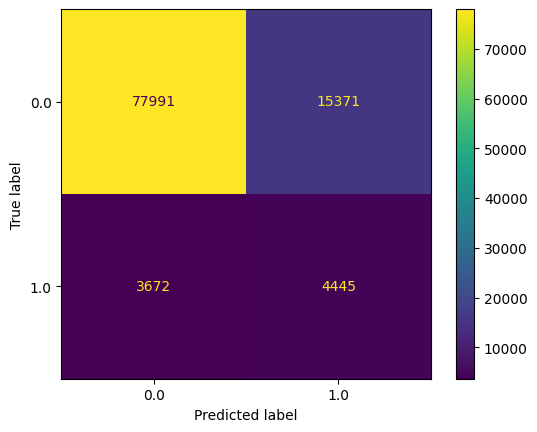

In [152]:
tn, fp, fn, tp = confusion_matrix(y_test, y_predic).ravel()
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

# Modélisation par CatBoost

In [93]:
cv = learn_model_cv(frac=1, model="catboost", force_param_opt=False, nb_splits=5)

Nb of training points: 206032
|   iter    |  target   | baggin... | l2_lea... | max_depth | max_le... | model_... |
-------------------------------------------------------------------------------------
Training on fold [0/5]
0:	test: 0.6931388	best: 0.6931388 (0)	total: 193ms	remaining: 1.73s
1:	test: 0.6994195	best: 0.6994195 (1)	total: 408ms	remaining: 1.63s
2:	test: 0.7017489	best: 0.7017489 (2)	total: 722ms	remaining: 1.68s
3:	test: 0.7075666	best: 0.7075666 (3)	total: 988ms	remaining: 1.48s
4:	test: 0.7137595	best: 0.7137595 (4)	total: 1.23s	remaining: 1.23s
5:	test: 0.7135852	best: 0.7137595 (4)	total: 1.44s	remaining: 958ms
6:	test: 0.7155784	best: 0.7155784 (6)	total: 1.66s	remaining: 712ms
7:	test: 0.7159144	best: 0.7159144 (7)	total: 1.91s	remaining: 477ms
8:	test: 0.7168062	best: 0.7168062 (8)	total: 2.13s	remaining: 237ms
9:	test: 0.7161262	best: 0.7168062 (8)	total: 2.36s	remaining: 0us

bestTest = 0.7168062141
bestIteration = 8

Training on fold [1/5]
0:	test: 0.6704820	b

2023/07/12 14:16:18 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:18 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:18 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16

Training on fold [0/5]
0:	test: 0.6903910	best: 0.6903910 (0)	total: 201ms	remaining: 1.81s
1:	test: 0.6985171	best: 0.6985171 (1)	total: 378ms	remaining: 1.51s
2:	test: 0.7057954	best: 0.7057954 (2)	total: 593ms	remaining: 1.38s
3:	test: 0.7054030	best: 0.7057954 (2)	total: 784ms	remaining: 1.18s
4:	test: 0.7054720	best: 0.7057954 (2)	total: 967ms	remaining: 967ms
5:	test: 0.7064578	best: 0.7064578 (5)	total: 1.15s	remaining: 766ms
6:	test: 0.7049974	best: 0.7064578 (5)	total: 1.36s	remaining: 584ms
7:	test: 0.7078271	best: 0.7078271 (7)	total: 1.56s	remaining: 391ms
8:	test: 0.7115140	best: 0.7115140 (8)	total: 1.79s	remaining: 199ms
9:	test: 0.7092838	best: 0.7115140 (8)	total: 2.01s	remaining: 0us

bestTest = 0.7115140381
bestIteration = 8

Training on fold [1/5]
0:	test: 0.6906319	best: 0.6906319 (0)	total: 226ms	remaining: 2.04s
1:	test: 0.6942157	best: 0.6942157 (1)	total: 415ms	remaining: 1.66s
2:	test: 0.6973323	best: 0.6973323 (2)	total: 610ms	remaining: 1.42s
3:	test: 0.6997

2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16:57 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:16

Training on fold [0/5]
0:	test: 0.6992913	best: 0.6992913 (0)	total: 219ms	remaining: 1.97s
1:	test: 0.7104603	best: 0.7104603 (1)	total: 429ms	remaining: 1.72s
2:	test: 0.7104293	best: 0.7104603 (1)	total: 636ms	remaining: 1.48s
3:	test: 0.7148416	best: 0.7148416 (3)	total: 853ms	remaining: 1.28s
4:	test: 0.7174278	best: 0.7174278 (4)	total: 1.06s	remaining: 1.06s
5:	test: 0.7179586	best: 0.7179586 (5)	total: 1.27s	remaining: 850ms
6:	test: 0.7163856	best: 0.7179586 (5)	total: 1.47s	remaining: 630ms
7:	test: 0.7173882	best: 0.7179586 (5)	total: 1.69s	remaining: 421ms
8:	test: 0.7178393	best: 0.7179586 (5)	total: 1.88s	remaining: 209ms
9:	test: 0.7182125	best: 0.7182125 (9)	total: 2.08s	remaining: 0us

bestTest = 0.7182124588
bestIteration = 9

Training on fold [1/5]
0:	test: 0.6840914	best: 0.6840914 (0)	total: 200ms	remaining: 1.8s
1:	test: 0.6974383	best: 0.6974383 (1)	total: 397ms	remaining: 1.59s
2:	test: 0.7011277	best: 0.7011277 (2)	total: 606ms	remaining: 1.41s
3:	test: 0.70102

2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17:36 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:17

Training on fold [0/5]
0:	test: 0.6940820	best: 0.6940820 (0)	total: 123ms	remaining: 1.11s
1:	test: 0.7006370	best: 0.7006370 (1)	total: 244ms	remaining: 976ms
2:	test: 0.7049136	best: 0.7049136 (2)	total: 371ms	remaining: 866ms
3:	test: 0.7100269	best: 0.7100269 (3)	total: 499ms	remaining: 749ms
4:	test: 0.7090766	best: 0.7100269 (3)	total: 626ms	remaining: 626ms
5:	test: 0.7083191	best: 0.7100269 (3)	total: 745ms	remaining: 497ms
6:	test: 0.7089228	best: 0.7100269 (3)	total: 870ms	remaining: 373ms
7:	test: 0.7072508	best: 0.7100269 (3)	total: 990ms	remaining: 248ms
8:	test: 0.7076563	best: 0.7100269 (3)	total: 1.12s	remaining: 125ms
9:	test: 0.7053420	best: 0.7100269 (3)	total: 1.25s	remaining: 0us

bestTest = 0.7100268656
bestIteration = 3

Training on fold [1/5]
0:	test: 0.6850191	best: 0.6850191 (0)	total: 122ms	remaining: 1.09s
1:	test: 0.6928374	best: 0.6928374 (1)	total: 241ms	remaining: 964ms
2:	test: 0.6933969	best: 0.6933969 (2)	total: 368ms	remaining: 858ms
3:	test: 0.6954

2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:11 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18

Training on fold [0/5]
0:	test: 0.6895175	best: 0.6895175 (0)	total: 178ms	remaining: 1.6s
1:	test: 0.6969652	best: 0.6969652 (1)	total: 363ms	remaining: 1.45s
2:	test: 0.6980308	best: 0.6980308 (2)	total: 529ms	remaining: 1.23s
3:	test: 0.6974495	best: 0.6980308 (2)	total: 688ms	remaining: 1.03s
4:	test: 0.6994123	best: 0.6994123 (4)	total: 884ms	remaining: 884ms
5:	test: 0.7008603	best: 0.7008603 (5)	total: 1.06s	remaining: 707ms
6:	test: 0.7061577	best: 0.7061577 (6)	total: 1.25s	remaining: 538ms
7:	test: 0.7063736	best: 0.7063736 (7)	total: 1.44s	remaining: 360ms
8:	test: 0.7047508	best: 0.7063736 (7)	total: 1.62s	remaining: 180ms
9:	test: 0.7047024	best: 0.7063736 (7)	total: 1.79s	remaining: 0us

bestTest = 0.7063736108
bestIteration = 7

Training on fold [1/5]
0:	test: 0.6845183	best: 0.6845183 (0)	total: 179ms	remaining: 1.61s
1:	test: 0.6878682	best: 0.6878682 (1)	total: 355ms	remaining: 1.42s
2:	test: 0.6932930	best: 0.6932930 (2)	total: 561ms	remaining: 1.31s
3:	test: 0.69162

2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18:50 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:18

Training on fold [0/5]
0:	test: 0.6934287	best: 0.6934287 (0)	total: 208ms	remaining: 1.88s
1:	test: 0.7040725	best: 0.7040725 (1)	total: 444ms	remaining: 1.78s
2:	test: 0.7037738	best: 0.7040725 (1)	total: 651ms	remaining: 1.52s
3:	test: 0.7101039	best: 0.7101039 (3)	total: 886ms	remaining: 1.33s
4:	test: 0.7161568	best: 0.7161568 (4)	total: 1.11s	remaining: 1.11s
5:	test: 0.7169511	best: 0.7169511 (5)	total: 1.34s	remaining: 894ms
6:	test: 0.7179096	best: 0.7179096 (6)	total: 1.58s	remaining: 678ms
7:	test: 0.7196136	best: 0.7196136 (7)	total: 1.8s	remaining: 450ms
8:	test: 0.7188039	best: 0.7196136 (7)	total: 2.03s	remaining: 226ms
9:	test: 0.7177910	best: 0.7196136 (7)	total: 2.26s	remaining: 0us

bestTest = 0.7196135551
bestIteration = 7

Training on fold [1/5]
0:	test: 0.6741826	best: 0.6741826 (0)	total: 210ms	remaining: 1.89s
1:	test: 0.6839346	best: 0.6839346 (1)	total: 417ms	remaining: 1.67s
2:	test: 0.6993206	best: 0.6993206 (2)	total: 641ms	remaining: 1.5s
3:	test: 0.704810

2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:19

Training on fold [0/5]
0:	test: 0.6932784	best: 0.6932784 (0)	total: 183ms	remaining: 1.65s
1:	test: 0.6950485	best: 0.6950485 (1)	total: 356ms	remaining: 1.42s
2:	test: 0.6966985	best: 0.6966985 (2)	total: 537ms	remaining: 1.25s
3:	test: 0.7004594	best: 0.7004594 (3)	total: 714ms	remaining: 1.07s
4:	test: 0.7057383	best: 0.7057383 (4)	total: 914ms	remaining: 914ms
5:	test: 0.7069096	best: 0.7069096 (5)	total: 1.1s	remaining: 735ms
6:	test: 0.7070977	best: 0.7070977 (6)	total: 1.29s	remaining: 553ms
7:	test: 0.7064620	best: 0.7070977 (6)	total: 1.46s	remaining: 366ms
8:	test: 0.7074365	best: 0.7074365 (8)	total: 1.65s	remaining: 183ms
9:	test: 0.7079838	best: 0.7079838 (9)	total: 1.83s	remaining: 0us

bestTest = 0.7079838031
bestIteration = 9

Training on fold [1/5]
0:	test: 0.6706491	best: 0.6706491 (0)	total: 166ms	remaining: 1.49s
1:	test: 0.6860800	best: 0.6860800 (1)	total: 332ms	remaining: 1.33s
2:	test: 0.6937548	best: 0.6937548 (2)	total: 526ms	remaining: 1.23s
3:	test: 0.69270

2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20

Training on fold [0/5]
0:	test: 0.6982638	best: 0.6982638 (0)	total: 219ms	remaining: 1.97s
1:	test: 0.7087513	best: 0.7087513 (1)	total: 431ms	remaining: 1.72s
2:	test: 0.7102221	best: 0.7102221 (2)	total: 652ms	remaining: 1.52s
3:	test: 0.7124590	best: 0.7124590 (3)	total: 862ms	remaining: 1.29s
4:	test: 0.7173554	best: 0.7173554 (4)	total: 1.07s	remaining: 1.07s
5:	test: 0.7178586	best: 0.7178586 (5)	total: 1.28s	remaining: 857ms
6:	test: 0.7154947	best: 0.7178586 (5)	total: 1.5s	remaining: 643ms
7:	test: 0.7147034	best: 0.7178586 (5)	total: 1.72s	remaining: 431ms
8:	test: 0.7133828	best: 0.7178586 (5)	total: 1.92s	remaining: 214ms
9:	test: 0.7145157	best: 0.7178586 (5)	total: 2.14s	remaining: 0us

bestTest = 0.7178585565
bestIteration = 5

Training on fold [1/5]
0:	test: 0.6844024	best: 0.6844024 (0)	total: 202ms	remaining: 1.81s
1:	test: 0.6969731	best: 0.6969731 (1)	total: 399ms	remaining: 1.6s
2:	test: 0.7001482	best: 0.7001482 (2)	total: 621ms	remaining: 1.45s
3:	test: 0.699741

2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20:49 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:20

Training on fold [0/5]
0:	test: 0.6756682	best: 0.6756682 (0)	total: 85.9ms	remaining: 773ms
1:	test: 0.6936903	best: 0.6936903 (1)	total: 171ms	remaining: 683ms
2:	test: 0.6965932	best: 0.6965932 (2)	total: 256ms	remaining: 597ms
3:	test: 0.6975387	best: 0.6975387 (3)	total: 341ms	remaining: 511ms
4:	test: 0.6970890	best: 0.6975387 (3)	total: 426ms	remaining: 426ms
5:	test: 0.6992105	best: 0.6992105 (5)	total: 511ms	remaining: 340ms
6:	test: 0.6969431	best: 0.6992105 (5)	total: 597ms	remaining: 256ms
7:	test: 0.7003562	best: 0.7003562 (7)	total: 685ms	remaining: 171ms
8:	test: 0.6989405	best: 0.7003562 (7)	total: 772ms	remaining: 85.8ms
9:	test: 0.6983220	best: 0.7003562 (7)	total: 865ms	remaining: 0us

bestTest = 0.7003562374
bestIteration = 7

Training on fold [1/5]
0:	test: 0.6649914	best: 0.6649914 (0)	total: 85.5ms	remaining: 769ms
1:	test: 0.6814534	best: 0.6814534 (1)	total: 170ms	remaining: 681ms
2:	test: 0.6807865	best: 0.6814534 (1)	total: 256ms	remaining: 597ms
3:	test: 0.6

2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21:22 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:21

Training on fold [0/5]
0:	test: 0.6899590	best: 0.6899590 (0)	total: 209ms	remaining: 1.88s
1:	test: 0.7082724	best: 0.7082724 (1)	total: 410ms	remaining: 1.64s
2:	test: 0.7111603	best: 0.7111603 (2)	total: 630ms	remaining: 1.47s
3:	test: 0.7168884	best: 0.7168884 (3)	total: 849ms	remaining: 1.27s
4:	test: 0.7167359	best: 0.7168884 (3)	total: 1.08s	remaining: 1.08s
5:	test: 0.7178421	best: 0.7178421 (5)	total: 1.3s	remaining: 871ms
6:	test: 0.7187706	best: 0.7187706 (6)	total: 1.54s	remaining: 661ms
7:	test: 0.7186233	best: 0.7187706 (6)	total: 1.76s	remaining: 441ms
8:	test: 0.7194409	best: 0.7194409 (8)	total: 1.98s	remaining: 220ms
9:	test: 0.7191796	best: 0.7194409 (8)	total: 2.19s	remaining: 0us

bestTest = 0.7194409286
bestIteration = 8

Training on fold [1/5]
0:	test: 0.6872175	best: 0.6872175 (0)	total: 222ms	remaining: 2s
1:	test: 0.6925764	best: 0.6925764 (1)	total: 422ms	remaining: 1.69s
2:	test: 0.6942872	best: 0.6942872 (2)	total: 645ms	remaining: 1.5s
3:	test: 0.7007797	b

2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22:04 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 14:22

Training on fold [0/5]
0:	test: 0.6930079	best: 0.6930079 (0)	total: 196ms	remaining: 1.76s
1:	test: 0.7017642	best: 0.7017642 (1)	total: 373ms	remaining: 1.49s
2:	test: 0.7060865	best: 0.7060865 (2)	total: 571ms	remaining: 1.33s
3:	test: 0.7111298	best: 0.7111298 (3)	total: 759ms	remaining: 1.14s
4:	test: 0.7103051	best: 0.7111298 (3)	total: 937ms	remaining: 937ms
5:	test: 0.7110454	best: 0.7111298 (3)	total: 1.12s	remaining: 745ms
6:	test: 0.7131560	best: 0.7131560 (6)	total: 1.32s	remaining: 565ms
7:	test: 0.7139103	best: 0.7139103 (7)	total: 1.53s	remaining: 382ms
8:	test: 0.7131410	best: 0.7139103 (7)	total: 1.71s	remaining: 190ms
9:	test: 0.7141923	best: 0.7141923 (9)	total: 1.89s	remaining: 0us

bestTest = 0.7141922629
bestIteration = 9

Training on fold [1/5]
0:	test: 0.6706395	best: 0.6706395 (0)	total: 176ms	remaining: 1.58s
1:	test: 0.6943151	best: 0.6943151 (1)	total: 375ms	remaining: 1.5s
2:	test: 0.7008979	best: 0.7008979 (2)	total: 562ms	remaining: 1.31s
3:	test: 0.70357

2023/07/12 14:32:01 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/07/12 14:32:01 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 562 seconds


<img src="mlruns/153868194415307648/9c53fbf24f9849b990c3d1b7eb23a917/artifacts/training_roc_curve.png">

In [104]:
logged_model = 'runs:/9c53fbf24f9849b990c3d1b7eb23a917/best_estimator'
model = mlflow.sklearn.load_model(logged_model)

X_test = pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]

In [105]:
view_scores_per_threshold(y_test, y_predic_proba)

In [112]:
y_predic = np.where(y_predic_proba>0.51,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.95      0.78      0.86     93362
         1.0       0.17      0.52      0.25      8117

    accuracy                           0.76    101479
   macro avg       0.56      0.65      0.55    101479
weighted avg       0.89      0.76      0.81    101479



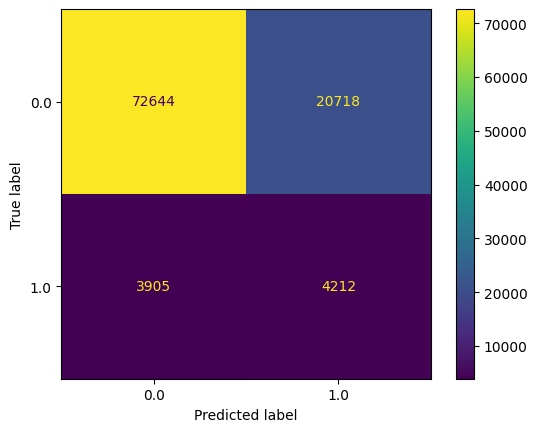

In [113]:
tn, fp, fn, tp = confusion_matrix(y_test, y_predic).ravel()
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

# Modélisation par LightGBM

In [115]:
cv = learn_model_cv(frac=1, model="lgb", force_param_opt=True, nb_splits=5)

Nb of training points: 206032
|   iter    |  target   | baggin... | featur... | max_depth | min_ch... | min_sp... | num_le... | reg_alpha | reg_la... |
-------------------------------------------------------------------------------------------------------------------------


/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:573: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



[LightGBM] [Warning] bagging_fraction is set=0.9464300757180009, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9464300757180009
[LightGBM] [Warning] bagging_fraction is set=0.9464300757180009, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9464300757180009
[LightGBM] [Warning] bagging_fraction is set=0.9464300757180009, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9464300757180009
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.9464300757180009, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 1         | 0.7813    | 0.9464    | 0.3656    | 17.32     | 6.876     | 0.01166   | 37.85     | 0.5293    | 41.88     |


/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:573: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



[LightGBM] [Warning] bagging_fraction is set=0.6677039246366646, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6677039246366646
[LightGBM] [Warning] bagging_fraction is set=0.6677039246366646, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6677039246366646
[LightGBM] [Warning] bagging_fraction is set=0.6677039246366646, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6677039246366646
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.369028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6677039246366646, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6677039246366646
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 2         | 0.782     | 0.6677    | 0.598     | 11.57     | 38.11     | 0.05229   | 37.37     | 0.6447    | 99.02     |


/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:573: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



[LightGBM] [Warning] bagging_fraction is set=0.9099290984609207, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9099290984609207
[LightGBM] [Warning] bagging_fraction is set=0.9099290984609207, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9099290984609207
[LightGBM] [Warning] bagging_fraction is set=0.9099290984609207, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9099290984609207
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.9099290984609207, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
| 3         | 0.782     | 0.9099    | 0.4306    | 18.14     | 42.07     | 0.006393  | 41.56     | 0.8014 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:573: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



[LightGBM] [Warning] bagging_fraction is set=0.8545658753905836, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8545658753905836
[LightGBM] [Warning] bagging_fraction is set=0.8545658753905836, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8545658753905836
[LightGBM] [Warning] bagging_fraction is set=0.8545658753905836, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8545658753905836
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.8545658753905836, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:573: UserWarning:

Found `n_estimators` in params. Will use it instead of argument



[LightGBM] [Warning] bagging_fraction is set=0.6278070278004175, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6278070278004175
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=0.6278070278004175, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6278070278004175
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=0.6278070278004175, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6278070278004175
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.315

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 5         | 0.7815    | 0.6278    | 0.637     | 13.99     | 37.28     | 0.0938    | 30.55     | 0.2534    | 40.25     |


2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54:05 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:54

[LightGBM] [Warning] bagging_fraction is set=0.6193916562337141, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6193916562337141
[LightGBM] [Warning] bagging_fraction is set=0.6193916562337141, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6193916562337141
[LightGBM] [Warning] bagging_fraction is set=0.6193916562337141, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6193916562337141
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.309054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6193916562337141, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6193916562337141
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 15:57

[LightGBM] [Warning] bagging_fraction is set=0.6741557623237113, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6741557623237113
[LightGBM] [Warning] bagging_fraction is set=0.6741557623237113, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6741557623237113
[LightGBM] [Warning] bagging_fraction is set=0.6741557623237113, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6741557623237113
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.329062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6741557623237113, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6741557623237113
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:01

[LightGBM] [Warning] bagging_fraction is set=0.6774439615444035, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6774439615444035
[LightGBM] [Warning] bagging_fraction is set=0.6774439615444035, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6774439615444035
[LightGBM] [Warning] bagging_fraction is set=0.6774439615444035, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6774439615444035
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.065793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6774439615444035, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:04

[LightGBM] [Warning] bagging_fraction is set=0.9843465998372909, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9843465998372909
[LightGBM] [Warning] bagging_fraction is set=0.9843465998372909, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9843465998372909
[LightGBM] [Warning] bagging_fraction is set=0.9843465998372909, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9843465998372909
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056828 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.9843465998372909, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No furthe

2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07:24 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:07

[LightGBM] [Warning] bagging_fraction is set=0.7542301258253552, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7542301258253552
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=0.7542301258253552, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7542301258253552
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] bagging_fraction is set=0.7542301258253552, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7542301258253552
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No furthe

2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:10

[LightGBM] [Warning] bagging_fraction is set=0.9533556823695153, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9533556823695153
[LightGBM] [Warning] bagging_fraction is set=0.9533556823695153, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9533556823695153
[LightGBM] [Warning] bagging_fraction is set=0.9533556823695153, subsample=0.75 will be ignored. Current value: bagging_fraction=0.9533556823695153
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.9533556823695153, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No furthe

2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13:28 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:13

[LightGBM] [Warning] bagging_fraction is set=0.6057648975190442, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6057648975190442
[LightGBM] [Warning] bagging_fraction is set=0.6057648975190442, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6057648975190442
[LightGBM] [Warning] bagging_fraction is set=0.6057648975190442, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6057648975190442
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.348479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6057648975190442, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6057648975190442
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 12        | 0.782     | 0.6058    | 0.6608    | 10.89     | 35.8      | 0.01247   | 37.73     | 0.4389    | 98.5      |


2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16:45 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:16

[LightGBM] [Warning] bagging_fraction is set=0.8153906292757622, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8153906292757622
[LightGBM] [Warning] bagging_fraction is set=0.8153906292757622, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8153906292757622
[LightGBM] [Warning] bagging_fraction is set=0.8153906292757622, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8153906292757622
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.346429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.8153906292757622, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8153906292757622
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20:34 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:20

[LightGBM] [Warning] bagging_fraction is set=0.6737195806570587, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6737195806570587
[LightGBM] [Warning] bagging_fraction is set=0.6737195806570587, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6737195806570587
[LightGBM] [Warning] bagging_fraction is set=0.6737195806570587, subsample=0.75 will be ignored. Current value: bagging_fraction=0.6737195806570587
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.076994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.6737195806570587, subsample=0.75 will be ignored. Current value: bagging_fract

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 14        | 0.7811    | 0.6737    | 0.4268    | 19.01     | 15.0      | 0.01739   | 20.23     | 0.6666    | 14.97     |


2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 16:24

[LightGBM] [Warning] bagging_fraction is set=0.7674226512863239, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7674226512863239
[LightGBM] [Warning] bagging_fraction is set=0.7674226512863239, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7674226512863239
[LightGBM] [Warning] bagging_fraction is set=0.7674226512863239, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7674226512863239
[LightGBM] [Info] Number of positive: 13366, number of negative: 151459
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.366825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 72979
[LightGBM] [Info] Number of data points in the train set: 164825, number of used features: 501
[LightGBM] [Warning] bagging_fraction is set=0.7674226512863239, subsample=0.75 will be ignored. Current value: bagging_fraction=0.7674226512863239
[LightGBM] [Warning] bagging_fraction is 

/home/jupyter/.local/lib/python3.8/site-packages/lightgbm/engine.py:620: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427601
[LightGBM] [Info] Start training from score -2.427601
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081098 -> initscore=-2.427526
[LightGBM] [Info] Start training from score -2.427526
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081092 -> initscore=-2.427607
[LightGBM] [Info] Start training from score -2.427607
| 15        | 0.7797    | 0.7674    | 0.8672    | 15.89     | 47.48     | 0.07072   | 22.48     | 0.6346    | 6.0       |
[LightGBM] [Warning] bagging_fraction is set=0.8545658753905836, subsample=0.75 will be ignored. Current value: bagging_fraction=0.8545658753905836
[LightGBM] [Warning] feature_fraction is set=0.5327494834420

2023/07/12 16:51:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/07/12 16:51:27 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 1442 seconds


<img src="mlruns/153868194415307648/009408e7a2bb411aa0f79b84f657d06d/artifacts/training_roc_curve.png">

In [116]:
logged_model = 'runs:/009408e7a2bb411aa0f79b84f657d06d/best_estimator'
model = mlflow.sklearn.load_model(logged_model)

X_test = pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]

In [117]:
view_scores_per_threshold(y_test, y_predic_proba)

In [118]:
y_predic = np.where(y_predic_proba>0.47,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.96      0.83      0.89     93362
         1.0       0.22      0.57      0.32      8117

    accuracy                           0.80    101479
   macro avg       0.59      0.70      0.60    101479
weighted avg       0.90      0.80      0.84    101479



In [119]:
tn, fp, fn, tp = confusion_matrix(y_test, y_predic).ravel()

In [120]:
print(confusion_matrix(y_test, y_predic))

[[77070 16292]
 [ 3517  4600]]


In [121]:
fn

3517

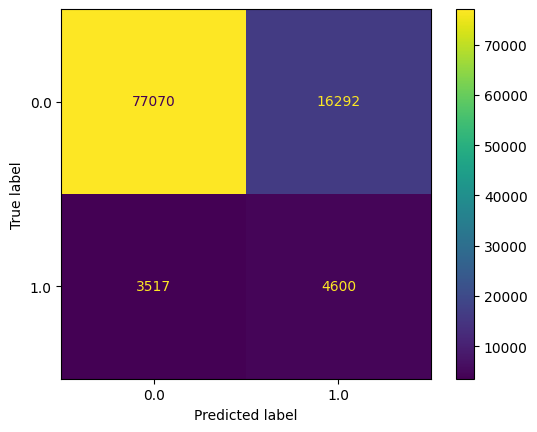

In [122]:
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

In [123]:
del X_test, y_test, y_predic, y_predic_proba
gc.collect()

50636

In [124]:
del model
gc.collect()

0

# Modélisation par XGBoost

In [15]:
mlflow.active_run()

<ActiveRun: >

In [20]:
cv = learn_model_cv(frac=1, model="xgb", force_param_opt=True, nb_splits=10)

Nb of training points: 206032
|   iter    |  target   | max_depth | max_le... | min_ch... | reg_alpha | reg_la... |
-------------------------------------------------------------------------------------
[08:40:33] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:40:37] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:40:41] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:40:45] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:40:49] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 1         | 0.7446    | 45.18     | 33.28     | 182.1     | 0.0417    | 1.969e-20 |
[08:43:26] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:43:30] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_

2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54:02 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:54

[08:54:21] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:54:25] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:54:29] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:54:33] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:54:37] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 6         | 0.7441    | 33.22     | 40.98     | 140.9     | 0.8127    | 4.967e-20 |


2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 08:57

[08:57:32] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:57:36] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:57:40] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:57:44] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[08:57:48] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 7         | 0.7445    | 14.03     | 38.63     | 140.4     | 1e-20     | 3.956e-20 |


2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:00

[09:00:28] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:00:32] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:00:36] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:00:40] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:00:44] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 8         | 0.7444    | 26.25     | 28.35     | 153.0     | 1e-20     | 5.138e-20 |


2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03:09 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:03

[09:03:28] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:03:32] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:03:36] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:03:41] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:03:45] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 9         | 0.7445    | 46.97     | 45.5      | 161.7     | 0.03631   | 3.584e-20 |


2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06:08 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:06

[09:06:27] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:06:31] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:06:35] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:06:39] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:06:43] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 10        | 0.7447    | 23.03     | 59.77     | 133.3     | 0.709     | 6.583e-20 |


2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09:13 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:09

[09:09:32] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:09:36] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:09:41] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:09:46] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:09:50] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 11        | 0.7445    | 49.77     | 21.18     | 164.2     | 0.9744    | 9.211e-20 |


2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12:19 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:12

[09:12:38] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:12:40] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:12:42] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:12:45] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:12:47] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 12        | 0.7244    | 5.331     | 56.74     | 117.3     | 0.08754   | 4.033e-20 |


2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13:46 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:13

[09:14:05] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:14:09] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:14:13] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:14:17] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:14:20] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 13        | 0.744     | 48.26     | 56.78     | 199.4     | 0.9301    | 8.074e-20 |


2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16:39 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:16

[09:16:58] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:17:02] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:17:06] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:17:10] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:17:14] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 14        | 0.7443    | 50.0      | 20.0      | 200.0     | 1e-20     | 5.23e-20  |


2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19:31 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: cannot create weak reference to 'tuple' object
2023/07/12 09:19

[09:19:51] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:19:55] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:20:00] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:20:05] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

[09:20:09] WARNING: ../src/learner.cc:767: 
Parameters: { "n_estimators", "random_seed" } are not used.

| 15        | 0.7439    | 50.0      | 20.0      | 100.0     | 1e-20     | 6.375e-20 |


2023/07/12 09:24:19 WARNING mlflow.utils: Truncated the value of the key `estimator`. Truncated value: `XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
            ...`


[09:24:28] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[09:32:51] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[09:41:46] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[09:50:16] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[09:58:10] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:07:16] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:15:22] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:24:24] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:33:18] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:42:10] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.

[10:51:04] WARNING: ../src/learner.cc:767: 
Parameters: { "random_seed" } are not used.



2023/07/12 11:00:24 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/jupyter/.local/lib/python3.8/site-packages/mlflow/sklearn/utils.py:788: UserWarning: Top 5 child runs will be created based on ordering in rank_test_AUC column.  You can choose not to limit the number of child runs created by setting `max_tuning_runs=None`."
2023/07/12 11:00:24 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


Trained all the fold in 5853 seconds


In [91]:
X_train= pd.read_parquet(f"../working/train_test_data/1/X_train.parquet")
y_train = np.load(f"../working/train_test_data/1/y_train.npy")
view_roc_cv(1, "xgb", X=X_train, y=y_train)

X.shape=(206032, 512)
y.shape=(206032,)


<img src="mlruns/153868194415307648/111380cf59d34cf7acaebea10d1e32fa/artifacts/training_roc_curve.png">

In [21]:
X_test= pd.read_parquet(f"../working/train_test_data/1/X_test.parquet")
y_test = np.load(f"../working/train_test_data/1/y_test.npy")
view_roc_cv(1, "xgb", X=X_test, y=y_test)

X.shape=(101479, 512)
y.shape=(101479,)


In [22]:
logged_model = 'runs:/111380cf59d34cf7acaebea10d1e32fa/best_estimator'

# Load model as a PyFuncModel.
model = mlflow.sklearn.load_model(logged_model)
y_predic_proba = model.predict_proba(X_test.to_numpy())[:, 1]
view_scores_per_threshold(y_test, y_predic_proba)

In [61]:
y_predic = np.where(y_predic_proba>0.49,1,0)
print(classification_report(y_test, y_predic))

              precision    recall  f1-score   support

         0.0       0.96      0.81      0.88     93362
         1.0       0.21      0.58      0.31      8117

    accuracy                           0.79    101479
   macro avg       0.58      0.69      0.59    101479
weighted avg       0.90      0.79      0.83    101479



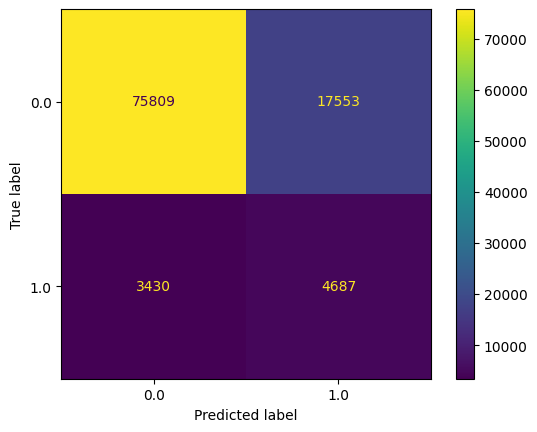

In [62]:
disp = ConfusionMatrixDisplay(
    confusion_matrix=confusion_matrix(y_test, y_predic),
    display_labels=model.classes_
)
disp.plot()
plt.show()

###### Les 2 modèles ont des ratios qui sont proches. Une analyse métier serait utile pour vois les différences entre les 2 et décider lequel prendre.

En l'état actuel, nous allons nous focaliser sur le fait de minimiser les faux négatifs, nous allons donc garder le modèle avec XGBoostClassifier

# Explication de modèle

In [25]:
logged_model = 'runs:/111380cf59d34cf7acaebea10d1e32fa/best_estimator'
# Load model as a PyFuncModel.
model = mlflow.sklearn.load_model(logged_model)

In [26]:
X = pd.read_parquet("../working/df_application_test.parquet")

In [28]:
explainer2 = shap.TreeExplainer(model, max_evals=1000, feature_names=X.columns)

In [29]:
X_shap2 = np.array(X.iloc[2001:2002].drop(columns="SK_ID_CURR"), dtype=float)


In [30]:
X.iloc[2000:2001]

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,BUREAU_DAYS_CREDIT_UPDATE_min,BUREAU_DAYS_CREDIT_UPDATE_max,BUREAU_DAYS_CREDIT_UPDATE_mean,BUREAU_DAYS_CREDIT_UPDATE_var,BUREAU_DAYS_CREDIT_UPDATE_sum,BUREAU_MONTHS_BALANCE_min,BUREAU_MONTHS_BALANCE_max,BUREAU_MONTHS_BALANCE_mean,BUREAU_MONTHS_BALANCE_var,BUREAU_MONTHS_BALANCE_sum
2000,114056,4,81000.0,296280.0,16069.5,225000.0,0.008866,-11715,-871,-1589.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
shap_values2 = explainer2(X_shap2)

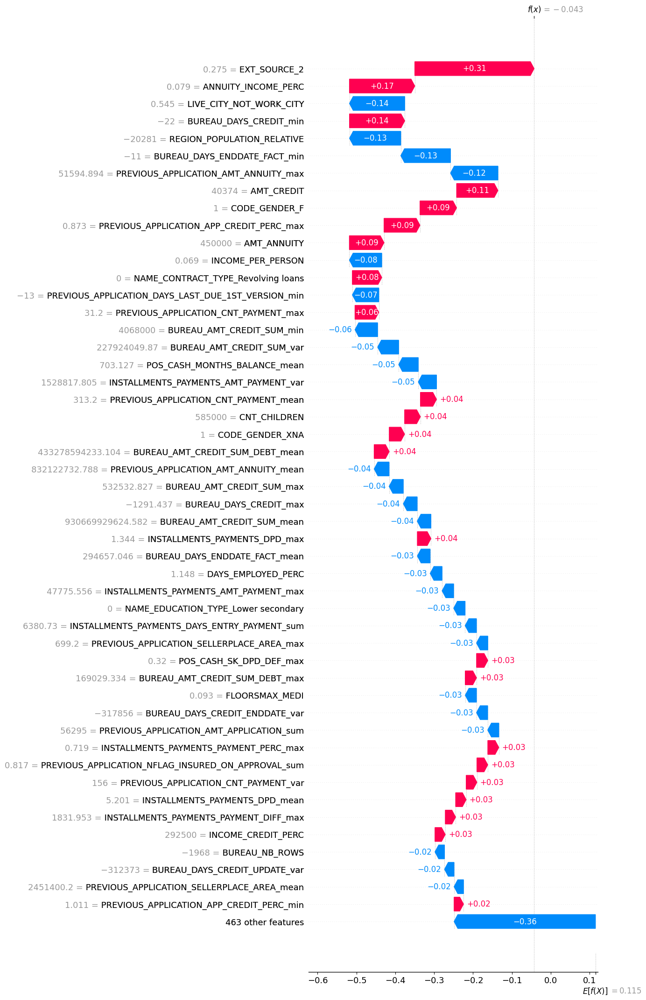

In [33]:
shap.plots.waterfall(shap_values2[0], max_display=50)


Créons une fonction générique:

In [42]:
import io
def get_explanation(sk_id_curr, max_display=50, return_base64=True, show_plot=False):
    ind = X.loc[X["SK_ID_CURR"]==sk_id_curr].index
    if len(ind)==0:
        return {
            "success": False,
            "message": f"SK_ID_CURR {sk_id_curr} non trouvé"
        }

    ind = ind[0]
    X_shap = np.array(X.iloc[ind:ind+1].drop(columns="SK_ID_CURR"), dtype=float)
    shap_values = explainer2(X_shap)

    if show_plot:
        shap.plots.waterfall(shap_values[0], max_display=max_display, show=True)
        
    if return_base64:
        plt.clf()

        shap.plots.waterfall(shap_values[0], max_display=max_display, show=False)
        plt.savefig(f"/tmp/{sk_id_curr}.png", format='png')

        with open(f"/tmp/{sk_id_curr}.png", "rb") as image_file:
            encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
        return {
            "success": True,
            "image": encoded_string
        }


In [47]:
from IPython.display import display, HTML
import base64 

e = get_explanation(456222, return_base64=True, show_plot=False)
#print(e)
display(HTML(f'<img src="data:image/png;base64, {e["image"]}">'))

# Récupération du modèle pour utilisation future

Nous avons utilisé MLFlow pour tracker les différentes expérimentations. 

Pour créer notre API, nous allons utiliser le modèle XGB enregistré dans MLFlow

<img src="mlflow_1.jpg">

On trouve facilement le chemin complet du dossier du meilleur modèle:
```
file:///home/jupyter/notebooks/modeling/mlruns/153868194415307648/111380cf59d34cf7acaebea10d1e32fa/artifacts/best_estimator
```

en particulier le fichier pickle:
```
/home/jupyter/notebooks/modeling/mlruns/153868194415307648/111380cf59d34cf7acaebea10d1e32fa/artifacts/best_estimator/model.pkl
```


Nous allons copier ce dossier dans le dossier destiné à notre API